# Random Forest For Weather Data

## This Script Containts the following:
1. Importing Libraries and Files
2. Data Preprocessing
3. Random Forest Model for a Decade 2012-2022
4. Weather Predictions For Most Important Stations

## 01. Importing Libraries and Files

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [2]:
path = r'/Users/niravbariya/Documents/Data Science/CareerFoundry/Machine Learning Specialization/Achievement 1 & 2/02 Data Sets'

In [3]:
tf.random.set_seed(42)

In [4]:
weather_cleaned = pd.read_csv(os.path.join(path, 'Unsupervised', 'weather_cleaned.csv'), index_col=False)

In [5]:
weather_cleaned.head(3)

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,1960-01-01
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,1960-01-02
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,1960-01-03


In [6]:
weather_pred = pd.read_csv(os.path.join(path, 'Unsupervised', 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'),index_col=False)

## 02. Data Preprocessing

In [7]:
# Making sure the date format is consistent
weather_pred['DATE'] = pd.to_datetime(weather_pred['DATE'], format = '%Y%m%d')

In [8]:
weather_cleaned['DATE'] = pd.to_datetime(weather_cleaned['DATE'])

In [9]:
# Subsetting a Decade of data from 2012 to 2022
df = weather_cleaned.loc[(weather_cleaned['DATE'].dt.year >= 2012) & (weather_cleaned['DATE'].dt.year < 2022)]

In [10]:
# Setting X and y
X=df.drop(columns = 'DATE')
y=weather_pred.loc[(weather_pred['DATE'].dt.year >= 2012) & (weather_pred['DATE'].dt.year < 2022)].drop(columns = 'DATE')

## 03. Random Forest Model for a Decade 2012-2022

In [255]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [256]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2922, 135) (2922, 15)
(731, 135) (731, 15)


In [257]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
clf.fit(X_train, y_train)

RandomForestClassifier()

In [258]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.6347469220246238


In [259]:
station = ['Basel','Belgrade', 'Budapest','Debilt','Dusseldorf','Heathrow','Kassel','Ljubljana','Maastricht','Madrid',
          'MunchenB','Oslo','Sonnblick','Stockholm','Valentia']

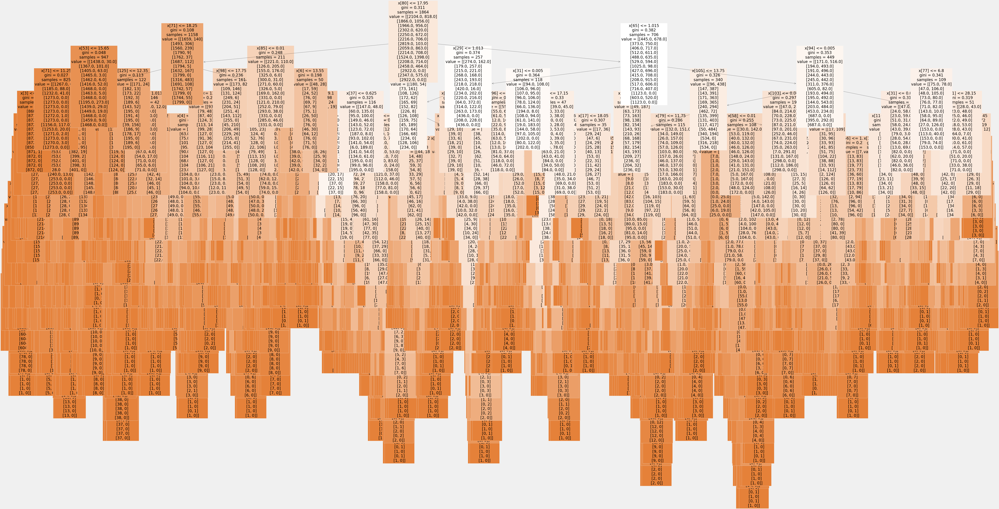

In [260]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[1], fontsize = 20, class_names=station, filled=True);

In [261]:
fig.savefig(f"{path}/decision_tree_1.png")

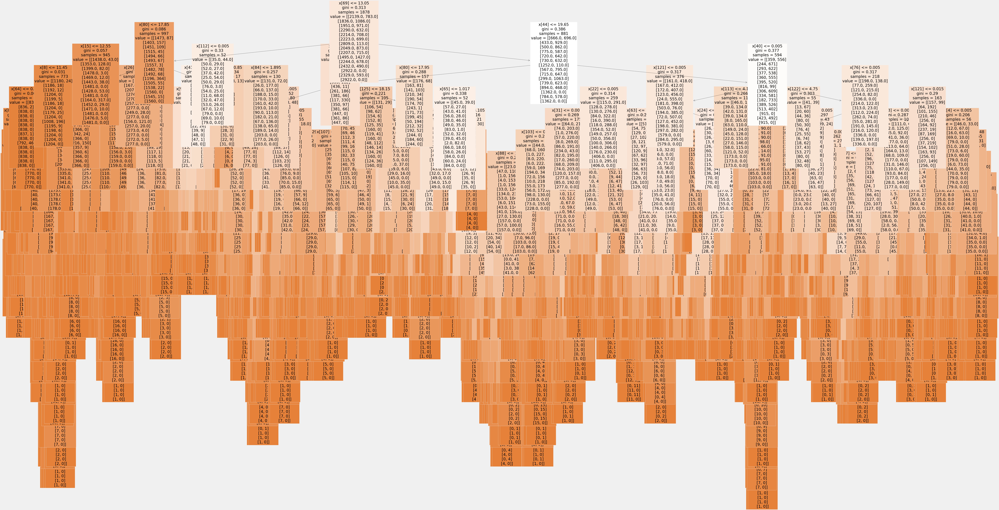

In [262]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[99], fontsize = 20, class_names=station, filled=True);

In [123]:
fig.savefig(f"{path}/decision_tree_2.png")

In [263]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)

array([0.00354661, 0.00468797, 0.0034402 , 0.00361084, 0.01625264,
       0.0085731 , 0.01471001, 0.00357675, 0.03807148, 0.00386967,
       0.00292447, 0.00475878, 0.00279919, 0.01799251, 0.00364225,
       0.0096704 , 0.00359155, 0.00964557, 0.        , 0.        ,
       0.        , 0.00054356, 0.01687848, 0.00044857, 0.01495976,
       0.00322142, 0.01284417, 0.00223874, 0.00312433, 0.00531158,
       0.0051637 , 0.01657156, 0.00494975, 0.0163799 , 0.00301462,
       0.03397666, 0.0023462 , 0.00308129, 0.00543535, 0.00335525,
       0.02495058, 0.0061324 , 0.01690464, 0.00294026, 0.04261413,
       0.00266802, 0.00414141, 0.00467019, 0.00378091, 0.010389  ,
       0.00492975, 0.01001289, 0.00522482, 0.01412652, 0.00345917,
       0.00155469, 0.00114483, 0.0017702 , 0.00195267, 0.00168655,
       0.00182621, 0.00140589, 0.00194711, 0.00338003, 0.00387907,
       0.0049442 , 0.00608743, 0.02068776, 0.00554523, 0.0130613 ,
       0.00769053, 0.02923397, 0.00356464, 0.00464835, 0.00436

In [264]:
newarray.shape

(135,)

In [265]:
np.set_printoptions(threshold=1000)

In [266]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00354661, 0.00468797, 0.0034402 , 0.00361084, 0.01625264,
         0.0085731 , 0.01471001, 0.00357675, 0.03807148],
        [0.00386967, 0.00292447, 0.00475878, 0.00279919, 0.01799251,
         0.00364225, 0.0096704 , 0.00359155, 0.00964557],
        [0.        , 0.        , 0.        , 0.00054356, 0.01687848,
         0.00044857, 0.01495976, 0.00322142, 0.01284417],
        [0.00223874, 0.00312433, 0.00531158, 0.0051637 , 0.01657156,
         0.00494975, 0.0163799 , 0.00301462, 0.03397666],
        [0.0023462 , 0.00308129, 0.00543535, 0.00335525, 0.02495058,
         0.0061324 , 0.01690464, 0.00294026, 0.04261413],
        [0.00266802, 0.00414141, 0.00467019, 0.00378091, 0.010389  ,
         0.00492975, 0.01001289, 0.00522482, 0.01412652],
        [0.00345917, 0.00155469, 0.00114483, 0.0017702 , 0.00195267,
         0.00168655, 0.00182621, 0.00140589, 0.00194711],
        [0.00338003, 0.00387907, 0.0049442 , 0.00608743, 0.02068776,
         0.00554523, 0.0130613 , 0.0076905

In [267]:
sumarray = np.sum(newarray[0], axis=1)
sumarray.shape

(15,)

In [268]:
important = pd.Series(sumarray, index = station) #.sort_values(ascending = False)
important

Basel         0.096470
Belgrade      0.058894
Budapest      0.048896
Debilt        0.090731
Dusseldorf    0.107760
Heathrow      0.059944
Kassel        0.016747
Ljubljana     0.094510
Maastricht    0.113120
Madrid        0.062789
MunchenB      0.087711
Oslo          0.062969
Sonnblick     0.037500
Stockholm     0.059230
Valentia      0.002731
dtype: float64

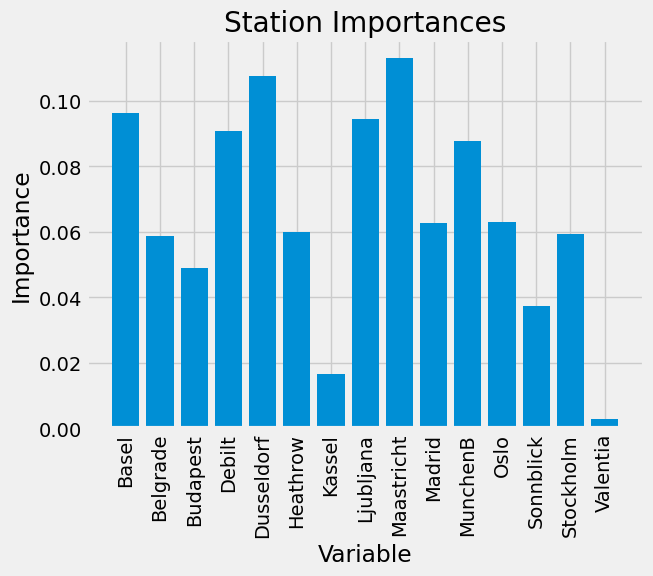

In [269]:
%matplotlib inline
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, station, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Station Importances');

In [270]:
plt.savefig(os.path.join('variable_importances.png'), bbox_inches='tight')

<Figure size 640x480 with 0 Axes>

The three most important stations are Maastricht, Basel, and Dusseldorf.

## 04. Weather Predictions For Most Important Stations

In [11]:
#loading original dataset
df = pd.read_csv(os.path.join(path,'Unsupervised','Dataset-weather-prediction-dataset-processed.csv'),index_col = False)

In [12]:
df.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


### i) For Maastricht

In [14]:
df1 = df[['MAASTRICHT_cloud_cover','MAASTRICHT_wind_speed','MAASTRICHT_humidity','MAASTRICHT_pressure','MAASTRICHT_global_radiation',
          'MAASTRICHT_precipitation','MAASTRICHT_sunshine','MAASTRICHT_temp_mean','MAASTRICHT_temp_min','MAASTRICHT_temp_max']]

In [15]:
df1.head(3)

,MAASTRICHT_cloud_cover,MAASTRICHT_wind_speed,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,8.7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,5.7,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,3.6,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9


In [16]:
X=df1
y=weather_pred['MAASTRICHT_pleasant_weather']

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [18]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 10) (18360,)
(4590, 10) (4590,)


In [19]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=5)  
  
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5)

In [20]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


This model gives **100% accuracy** for the weather station MAASTRICHT.

In [21]:
prediction = {0:'Unpleasant', 1:'Pleasant'}

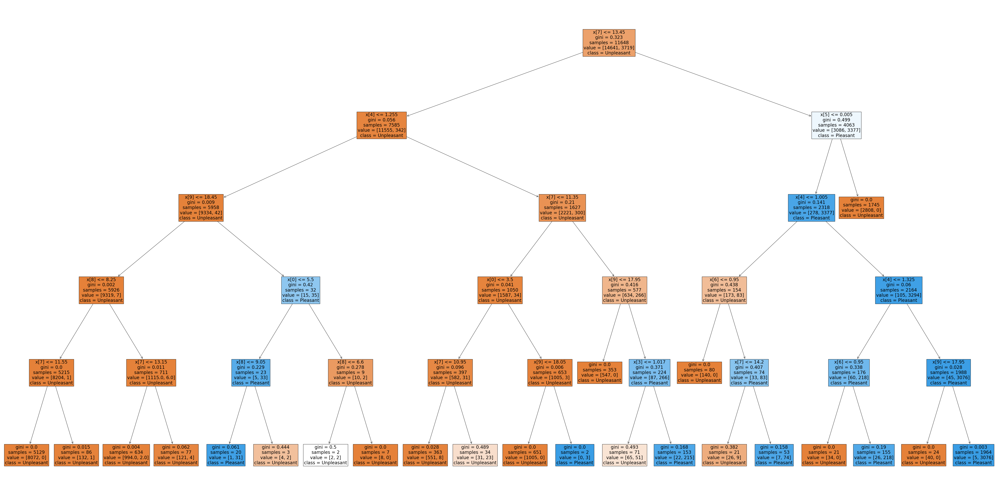

In [22]:
# Plotting only Single Decision Tree from 100
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[1], fontsize = 20, class_names=prediction, filled=True);

In [23]:
fig.savefig(f"{path}/decision_tree_MAASTRICHT.png")

In [24]:
imp_features = clf.feature_importances_

imp_features

array([0.04428435, 0.00138402, 0.03688333, 0.01174353, 0.07538777,
       0.2705835 , 0.07164736, 0.13841967, 0.02609502, 0.32357147])

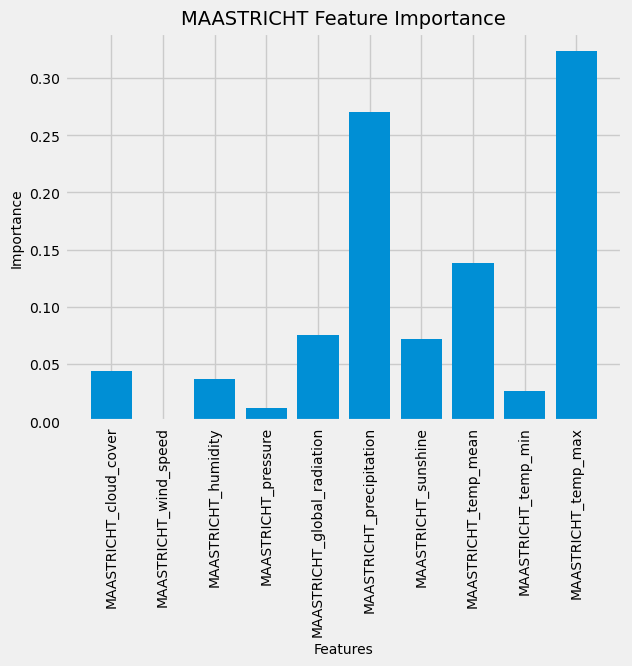

In [25]:
%matplotlib inline
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(imp_features)))

plt.bar(x_values, imp_features, orientation = 'vertical')
plt.xticks(x_values, X_train.columns.to_list(), rotation='vertical',fontsize=10)
plt.ylabel('Importance',fontsize=10); plt.xlabel('Features',fontsize=10); plt.title('MAASTRICHT Feature Importance',fontsize=14);
plt.yticks(fontsize=10);

In [191]:
plt.savefig(os.path.join(path,'LJUBLJANA Feature Importance.png'))

<Figure size 640x480 with 0 Axes>

### ii) For Basel

In [192]:
df2 = df[['BASEL_cloud_cover','BASEL_wind_speed','BASEL_humidity','BASEL_pressure','BASEL_global_radiation',
          'BASEL_precipitation','BASEL_snow_depth','BASEL_sunshine','BASEL_temp_mean','BASEL_temp_min','BASEL_temp_max']]

In [193]:
df2.head(3)

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,7,2.1,0.85,1.018,0.32,0.09,0,0.7,6.5,0.8,10.9
1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,6.1,3.3,10.1
2,8,2.1,0.90,1.018,0.18,0.30,0,0.0,8.5,5.1,9.9


In [195]:
X=df2
y=weather_pred['BASEL_pleasant_weather']

In [196]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [215]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=5)  
  
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5)

In [216]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9997821350762527


This model gives almost **100% accuracy** for the weather station BASEL.

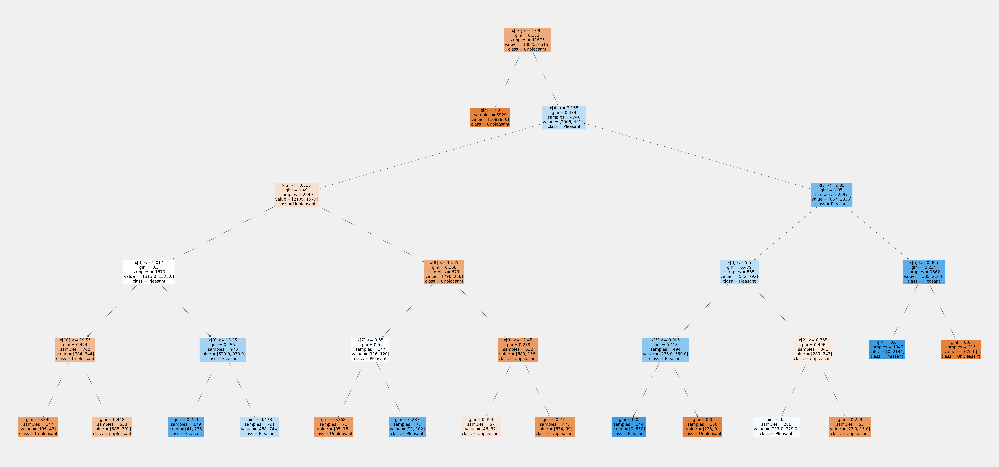

In [217]:
# Plotting only Single Decision Tree from 100
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[10], fontsize = 20, class_names=prediction, filled=True);

In [218]:
fig.savefig(f"{path}/decision_tree_BASEL.png")

In [219]:
imp_features = clf.feature_importances_

imp_features

array([3.61710117e-02, 2.12872295e-04, 1.43143098e-02, 8.46157821e-03,
       9.06555737e-02, 2.81975603e-01, 2.80483258e-05, 1.33499420e-01,
       9.81567348e-02, 3.46810547e-02, 3.01843793e-01])

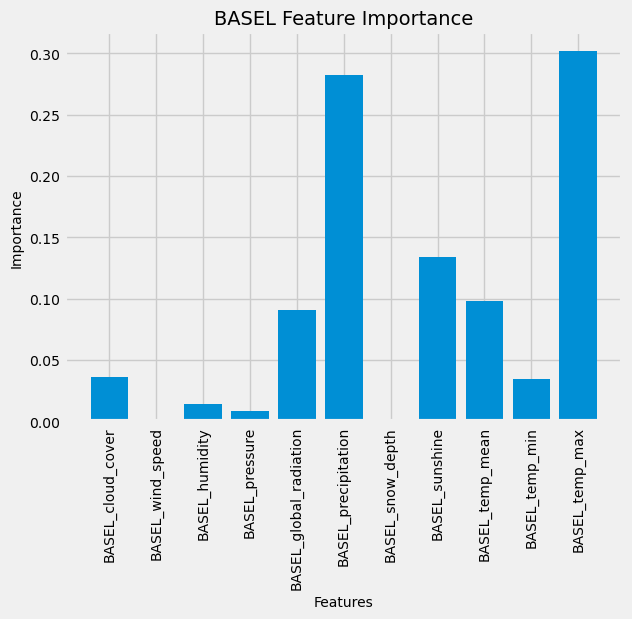

In [221]:
%matplotlib inline
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(imp_features)))

plt.bar(x_values, imp_features, orientation = 'vertical')
plt.xticks(x_values, X_train.columns.to_list(), rotation='vertical',fontsize=10)
plt.ylabel('Importance',fontsize=10); plt.xlabel('Features',fontsize=10); plt.title('BASEL Feature Importance',fontsize=14);
plt.yticks(fontsize=10);

The most important features are precipitation, temp_max, and sunshine for Basel.

### ii) For Dusseldorf

In [222]:
df3 = df[['DUSSELDORF_cloud_cover','DUSSELDORF_wind_speed','DUSSELDORF_humidity','DUSSELDORF_pressure','DUSSELDORF_global_radiation',
          'DUSSELDORF_precipitation','DUSSELDORF_snow_depth','DUSSELDORF_sunshine','DUSSELDORF_temp_mean','DUSSELDORF_temp_min',
          'DUSSELDORF_temp_max']]

In [223]:
df3.head(2)

,DUSSELDORF_cloud_cover,DUSSELDORF_wind_speed,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_snow_depth,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,5.4,0.83,1.0161,0.12,0.08,0,0.0,10.0,7.0,11.5
1,8,3.6,0.89,1.0161,0.18,0.66,0,0.5,8.2,7.4,11.0


In [224]:
X=df3
y=weather_pred['DUSSELDORF_pleasant_weather']

In [225]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [237]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
clf.fit(X_train, y_train)

RandomForestClassifier()

In [238]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


The model gives us **100% accuracy** for the Dusseldorf station.

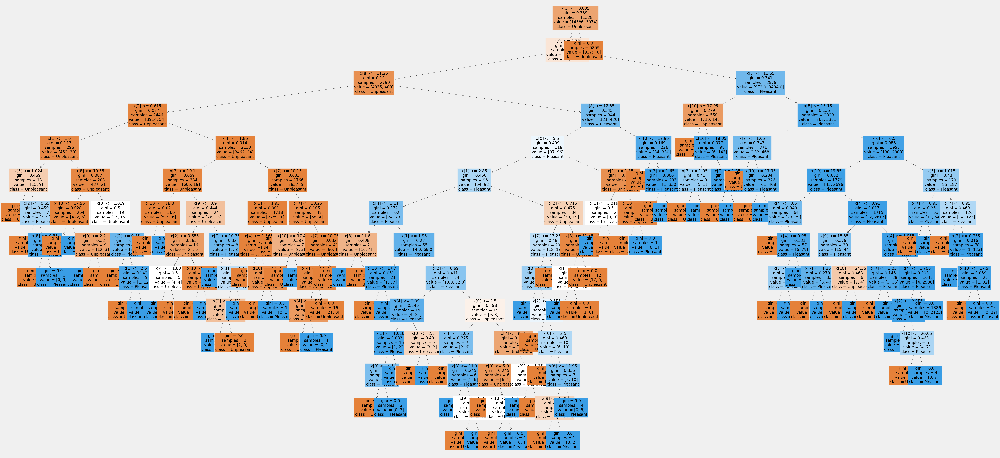

In [239]:
# Plotting only Single Decision Tree from 100
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[66], fontsize = 20, class_names=prediction, filled=True);

In [240]:
fig.savefig(f"{path}/decision_tree_DUSSELDORF.png")

In [241]:
imp_features = clf.feature_importances_

imp_features

array([0.03524765, 0.006188  , 0.01822371, 0.0147662 , 0.08394275,
       0.3353669 , 0.        , 0.07864967, 0.14873671, 0.0249543 ,
       0.25392412])

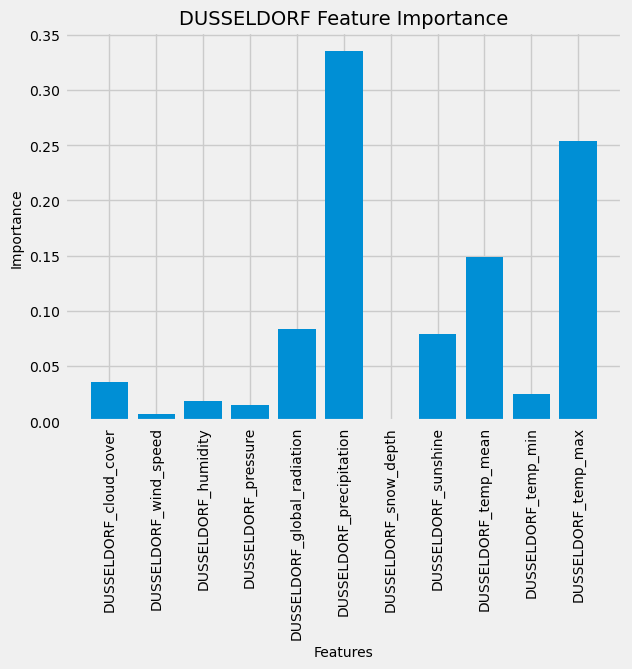

In [242]:
%matplotlib inline
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(imp_features)))

plt.bar(x_values, imp_features, orientation = 'vertical')
plt.xticks(x_values, X_train.columns.to_list(), rotation='vertical',fontsize=10)
plt.ylabel('Importance',fontsize=10); plt.xlabel('Features',fontsize=10); plt.title('DUSSELDORF Feature Importance',fontsize=14);
plt.yticks(fontsize=10);

The most important features for DUSSELDORF station are precipitation, temp_max, and temp_mean.